## Differential Phase Contrast Microscopy for atomic resolution images

Notebooks prepared by Debangshu Mukherjee 
Email: [mukherjeed@ornl.gov](mailto:mukherjeed@ornl.gov)/[debangshu24@gmail.com](mailto:debangshu24@gmail.com)

This notebook will go through the steps on how to analyze the data for atomic resolution DPC

First, if `stemtool` is not installed, we install it:

### Import packages
---
First, we import the requisite packages. The `json` and `sys` packages are required for loading the data. Along with the standard *Python* packages of `numpy` and `matplotlib` we also import the **STEMTool** package as `import stemtool as st`

In [1]:
import json
import numpy as np
import sys
import matplotlib.pyplot as plt
import stemtool as st
%matplotlib inline

### Load the working data and metadata
---
* Go to yout folder where the data is
* We are working with **NION** data, for which the data is stored as a *.npy* file and a corresponding *.json* file which stores the corresponding metadata
* For atomic resolution DPC, especially for weak phase object samples, the correction of the detector rotation angle with the optic axis needs the corresponding ADF-STEM image too, and thus that image needs to be loaded too
* The metadata has the calibration parameters, which are saved in the workspace as `scan_calib_vals` and `scan_calib_unit`.
* If the condenser aperture and the accelerating voltage are known - then the Fourier space can directly be calibrated

In [2]:
folder_loc = '/home/qz7/Data/TMD 4D-STEM/Nion Swift Library 20190126 MoSe2 CVD B17/'
data_num = 'Data1'
st.tic()
Data_4D = np.load(folder_loc+data_num+'_4D.npy')
json_4D = folder_loc+data_num+'_4D.json'
DataADF = np.load(folder_loc+data_num+'_ADF.npy')
jsonADF = folder_loc+data_num+'_ADF.json'
with open(json_4D) as json__4D:
    info_4D = json.load(json__4D)
with open(jsonADF) as json_ADF:
    infoADF = json.load(json_ADF)
scan_calib_vals = infoADF['spatial_calibrations'][0]['scale']
scan_calib_unit = infoADF['spatial_calibrations'][0]['units']
st.toc()

Elapsed time: 3.303474 seconds.



### Initialize the DPC class
---
The `atomic_dpc` class in the `dpc` module of **STEMTool** is used for calculating the differential phase contrast microscopy in the package. The package loads the following parameters in order as:
* **Data_4D**: Four-dimensional dataset where the first two dimensions are real space scanning dimensions, while the last two dimenions are the Fourier space electron diffraction patterns. In this example, this is `Data_4D`
* **Data_ADF**: Simultaneously collected two-dimensional ADF-STEM image. In this example, this is `DataADF`
* **calib_pm**: Real space pixel calibration in picometers. Here it is `1000*scan_calib_vals`
* **voltage**:  Microscope accelerating voltage in kV. Here it is `60`
* **aperture**: The probe forming condenser aperture in milliradians. Here it is `31`. This is a parameter that must be known during the time of the experiment, same as **voltage**.

In [3]:
DPC = st.dpc.atomic_dpc(Data_4D, DataADF, 1000*scan_calib_vals, 60, 31)

The class function itself has a lot of the documentation built in, and this can be found out by `help(st.dpc.atomic_dpc`

In [4]:
help(st.dpc.atomic_dpc)

Help on class atomic_dpc in module stemtool.dpc.atomic_dpc:

class atomic_dpc(builtins.object)
 |  atomic_dpc(Data_4D, Data_ADF, calib_pm, voltage, aperture)
 |  
 |  Atomic Resolution DPC estimation
 |  
 |  Parameters
 |  ----------
 |  Data_4D:  ndarray
 |            Four-dimensional dataset where the first two
 |            dimensions are real space scanning dimensions,
 |            while the last two dimenions are the Fourier 
 |            space electron diffraction patterns
 |  Data_ADF: ndarray
 |            Simultaneously collected two-dimensional ADF-STEM
 |            image
 |  calib_pm: float
 |            Real space pixel calibration in picometers
 |  voltage:  float
 |            Microscope accelerating voltage in kV
 |  aperture: float
 |            The probe forming condenser aperture in milliradians
 |  
 |  Notes
 |  -----
 |  This class function takes in a 4D-STEM image, and a simultaneously
 |  collected atomic resolution ADF-STEM image. Based on the accelerating
 

### Check data quality
---
Once the data is loaded, we can check whether the data makes sense. We check that by calling the class function `show_ADF_BF`, which plots both the **ADF_STEM** and the synthetic **BF-STEM** image. The synthetic BF-STEM image is generated by summing the diffraction patterns acreoss the 4D-STEM dataset. If the data is OK, these two images must be complementary.

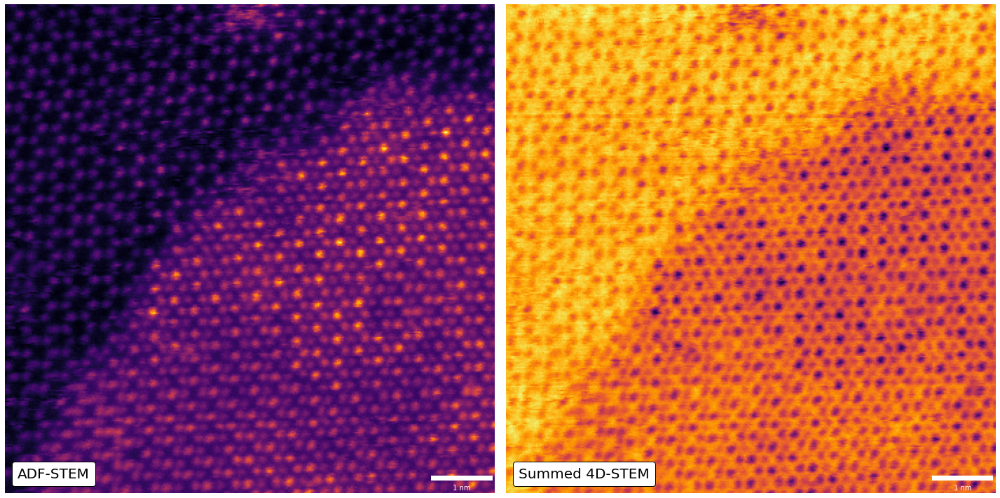

In [5]:
DPC.show_ADF_BF()

### Generate Fourier calibrations
---
Next we generate the Fourier calibrations, by generating the mean diffrraction pattern, and fitting a circle function to that pattern, which is the central disk.

Elapsed time: 1.083005 seconds.



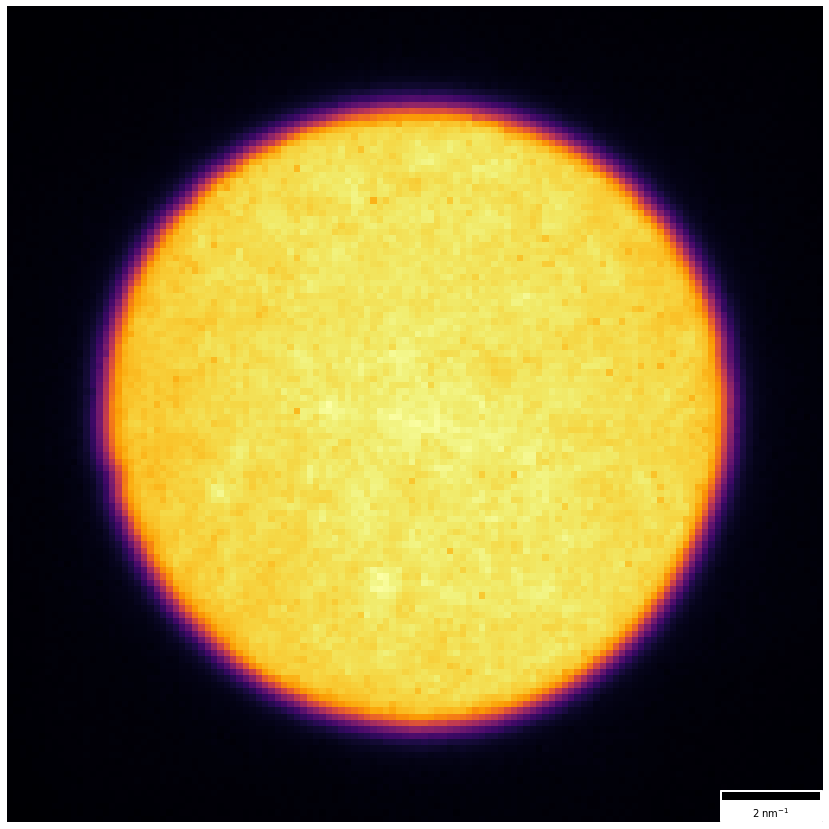

In [6]:
st.tic()
DPC.get_cbed(show_image = True)
st.toc()

### Calculate Initial DPC
---
We calculate the initial DPC results by measuring the center of mass of every diffraction disk, and then comparing the location of the center of mass with the disk position. This can be generated by calling the class function `DPC.initial_dpc()`

Elapsed time: 9.146991 seconds.



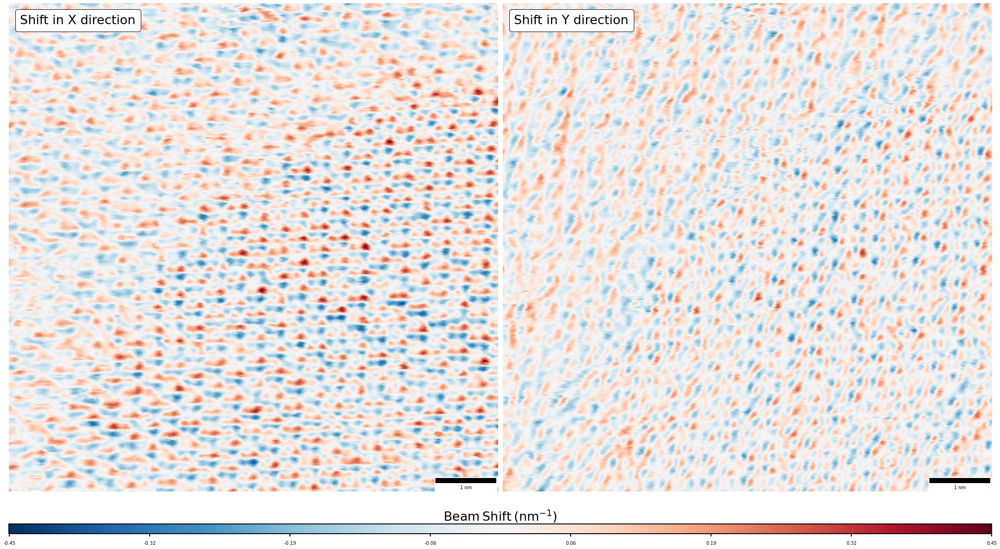

In [7]:
st.tic()
DPC.initial_dpc()
st.toc()

### Correct DPC rotations
---
**However!** for experimental images, we often find that the 

Elapsed time: 0.652032 seconds.



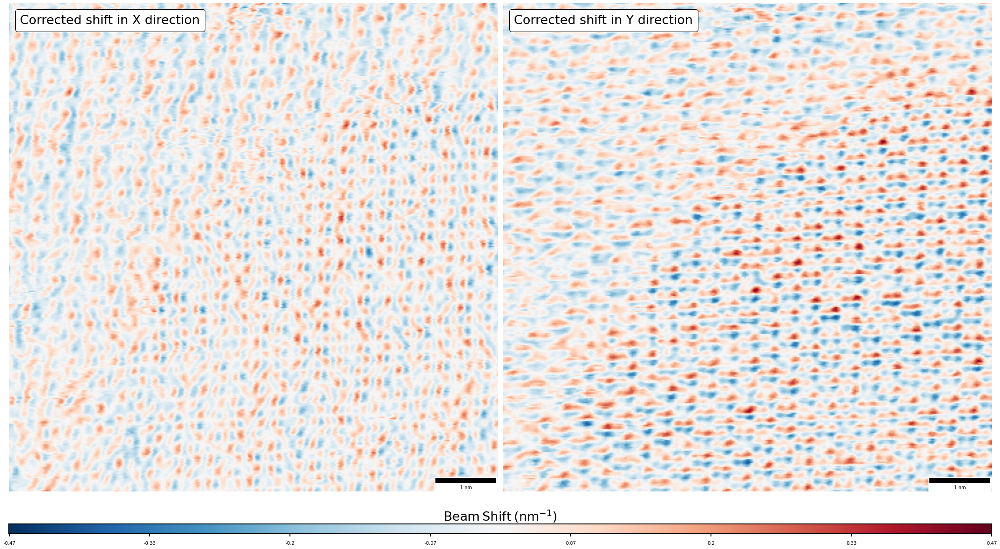

In [8]:
st.tic()
DPC.correct_dpc()
st.toc()

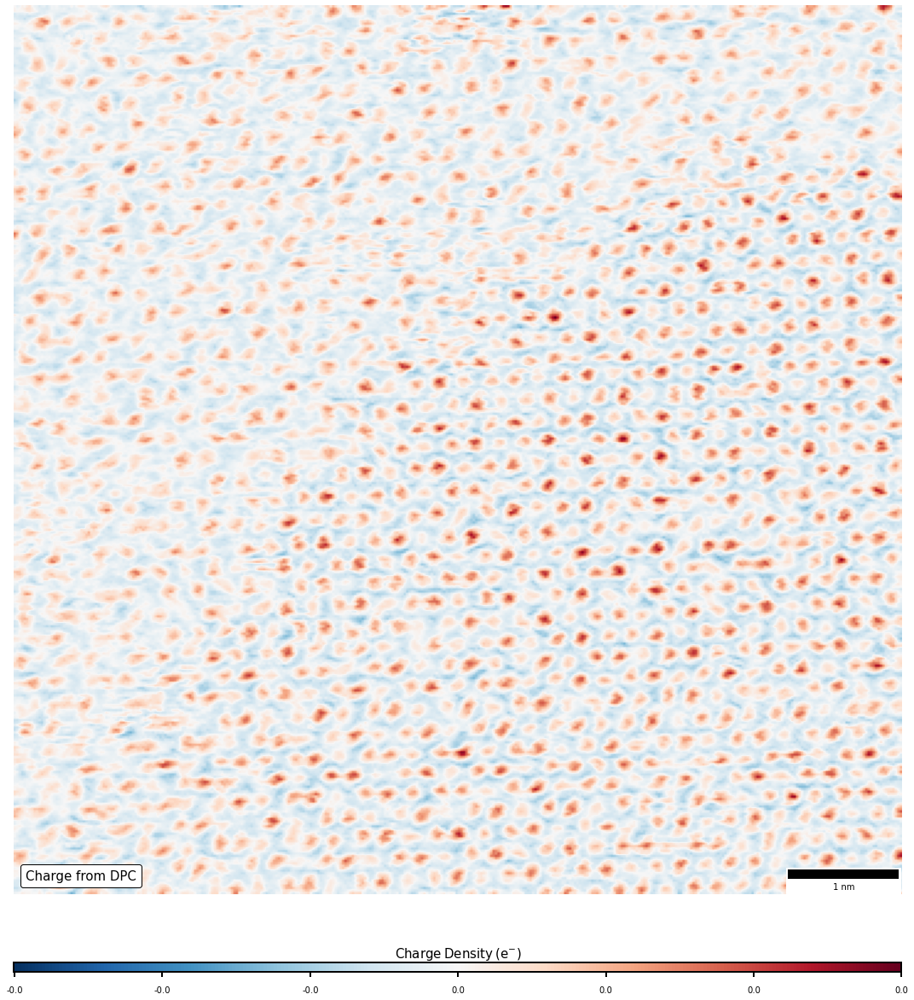

In [9]:
DPC.show_charge()

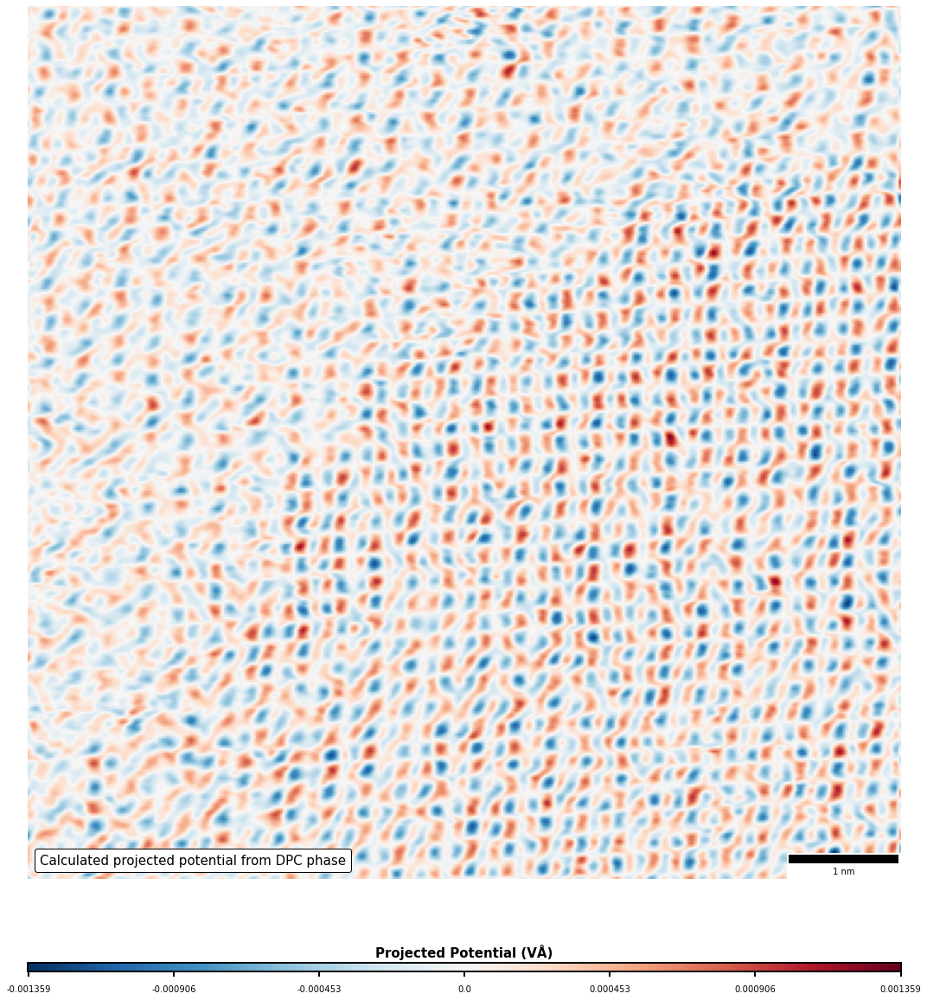

In [10]:
DPC.show_potential()

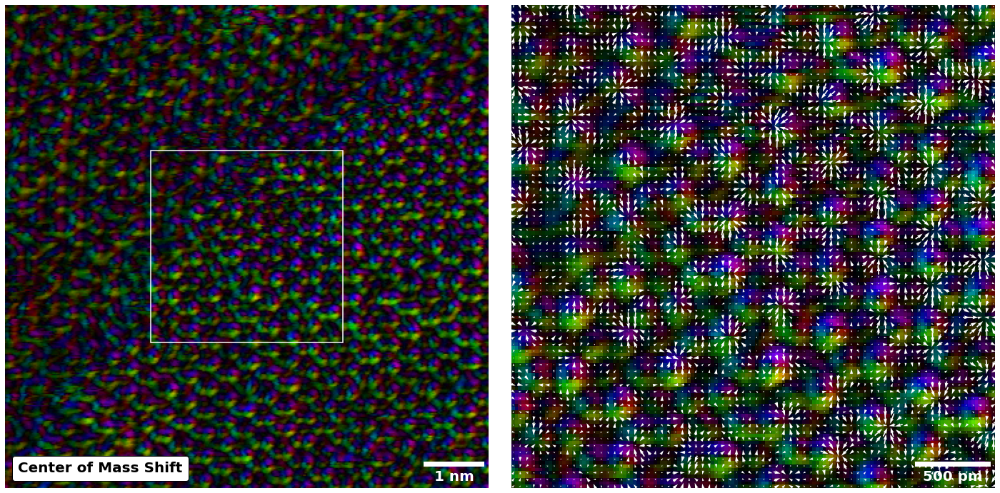

In [12]:
DPC.plot_color_dpc(start_frac=0.3, size_frac=0.4)

Finally, we can also go through the list of the DPC class variables to check all the temporary variables too.

In [13]:
DPC.__dict__.keys()

dict_keys(['data_adf', 'data_4D', 'calib', 'voltage', 'wavelength', 'aperture', 'planck', 'epsilon0', 'e_charge', 'sigma', 'data_bf', 'cbed', 'beam_x', 'beam_y', 'beam_r', 'inverse', 'YCom', 'XCom', 'angle', 'final_flip', 'XComC', 'YComC', 'MomentumX', 'MomentumY', 'e_fieldX', 'e_fieldY', 'charge', 'phase', 'potential'])

In [14]:
DPC.angle

-102.66844364666798